# Enhanced Telecom KPI EDA with Stepwise Preprocessing and Visualizer
This notebook performs exploratory data analysis (EDA) on telecom KPI data, with stepwise preprocessing and data shape reporting. All visualizations use the custom `visualizer.py` file for consistency and clarity.

**Outline:**
1. Import Required Libraries and Visualizer
2. Load Dataset and Show Initial Shape
3. Inspect Columns, Data Types, and Show Shape
4. Check for Missing Values and Show Shape
5. Statistical Summary and Shape
6. Visualize Distributions and Show Shape
7. Correlation Analysis and Shape
8. Advanced Preprocessing: Rolling Features, Lag Features, Scaling (Show Shape After Each Step)
9. Train/Test Split and Show Dimensions

In [1]:
# 1. Import Required Libraries and Visualizer
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
import visualizer
import sys
print('Python version:', sys.version)
print('pandas:', pd.__version__)
print('numpy:', np.__version__)
print('matplotlib:', plt.matplotlib.__version__)
print('seaborn:', sns.__version__)

Python version: 3.12.11 | packaged by conda-forge | (main, Jun  4 2025, 14:29:09) [MSC v.1943 64 bit (AMD64)]
pandas: 2.3.1
numpy: 1.26.4
matplotlib: 3.10.3
seaborn: 0.13.2


In [2]:
# 2. Load Dataset and Show Initial Shape
data_path = 'AD_data_10KPI.csv'
df = pd.read_csv(data_path)
print('Initial data shape:', df.shape)
df.head()

Initial data shape: (21060, 13)


,Date,Site_ID,Sector_ID,RSRP,DL_Throughput,Call_Drop_Rate,RTT,CPU_Utilization,Active_Users,SINR,UL_Throughput,Handover_Success_Rate,Packet_Loss
0,2024-01-01,SITE_001,SITE_001_SECTOR_A,-79.462059,68.142779,0.380281,19.436796,59.616487,595.056635,6.077811,27.694529,98.792815,1.967683
1,2024-01-02,SITE_001,SITE_001_SECTOR_A,-71.820295,83.180071,0.942784,22.520192,65.949334,735.979107,10.058988,31.392412,99.900000,1.973420
2,2024-01-03,SITE_001,SITE_001_SECTOR_A,-73.384287,82.825216,0.582166,24.959287,70.227355,773.059350,14.216732,34.458673,99.900000,2.123103
3,2024-01-04,SITE_001,SITE_001_SECTOR_A,-75.877396,74.881278,0.798489,18.390358,68.866222,652.829419,9.319930,32.459693,99.900000,2.037687
4,2024-01-05,SITE_001,SITE_001_SECTOR_A,-84.897973,69.188088,0.268886,14.544762,63.133935,588.094984,4.789089,21.616319,98.273033,1.581986


In [6]:
# 3. Inspect Columns, Data Types, and Show Shape
print('Column names:', df.columns.tolist())
print('Data types:')
print(df.dtypes)
print('Data shape after inspection:', df.shape)

Column names: ['Date', 'Site_ID', 'Sector_ID', 'RSRP', 'DL_Throughput', 'Call_Drop_Rate', 'RTT', 'CPU_Utilization', 'Active_Users', 'SINR', 'UL_Throughput', 'Handover_Success_Rate', 'Packet_Loss']
Data types:
Date                      object
Site_ID                   object
Sector_ID                 object
RSRP                     float64
DL_Throughput            float64
Call_Drop_Rate           float64
RTT                      float64
CPU_Utilization          float64
Active_Users             float64
SINR                     float64
UL_Throughput            float64
Handover_Success_Rate    float64
Packet_Loss              float64
dtype: object
Data shape after inspection: (21060, 13)


In [3]:
# 4. Check for Missing Values and Show Shape
print('Missing values per column:')
print(df.isnull().sum())
df_clean = df.dropna()
print('Shape after dropping rows with any missing values:', df_clean.shape)

Missing values per column:
Date                     0
Site_ID                  0
Sector_ID                0
RSRP                     0
DL_Throughput            0
Call_Drop_Rate           0
RTT                      0
CPU_Utilization          0
Active_Users             0
SINR                     0
UL_Throughput            0
Handover_Success_Rate    0
Packet_Loss              0
dtype: int64
Shape after dropping rows with any missing values: (21060, 13)


In [5]:
# 5. Statistical Summary and Shape
print('Statistical summary for numeric columns:')
print(df.describe())
print('Shape after summary (unchanged):', df.shape)

Statistical summary for numeric columns:
               RSRP  DL_Throughput  Call_Drop_Rate           RTT  \
count  21060.000000   21060.000000    21060.000000  21060.000000   
mean     -97.376181      56.168821        2.930911     26.400632   
std       49.149994      37.739920        2.342453     21.819920   
min    -2976.942068    -502.592078      -21.446340   -216.189820   
25%     -108.221321      30.912114        1.329165     12.224171   
50%      -95.352451      54.207213        2.718754     25.682195   
75%      -81.561774      78.746875        4.204809     38.485433   
max      273.442989     796.769299       60.349193    564.395257   

       CPU_Utilization  Active_Users          SINR  UL_Throughput  \
count     21060.000000  21060.000000  21060.000000   21060.000000   
mean         52.777571    583.164028     10.422765      29.954624   
std          28.963308    383.623587     16.343734      26.004931   
min        -155.640426  -6337.845385   -284.736289    -214.105998   
2

Visualizing distribution for RSRP (shape: (21060, 13))


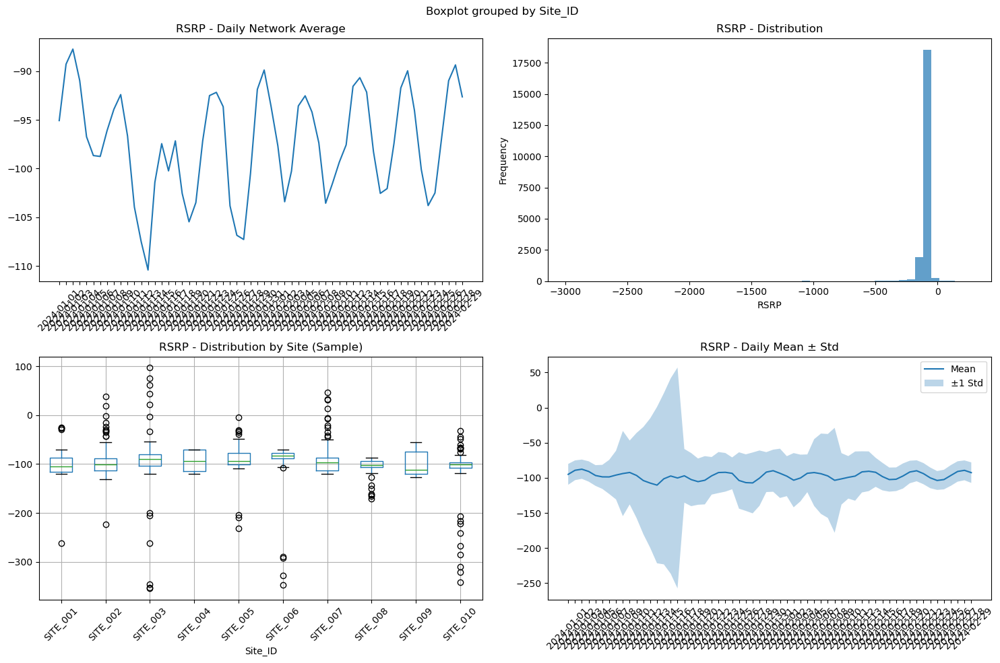

Visualizing distribution for DL_Throughput (shape: (21060, 13))


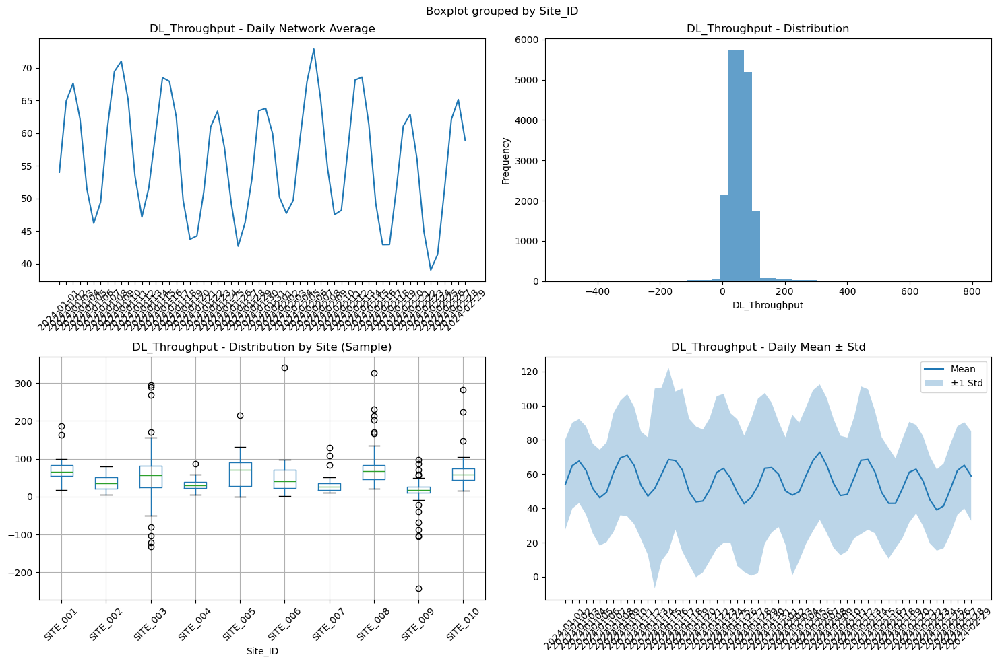

Visualizing distribution for Call_Drop_Rate (shape: (21060, 13))


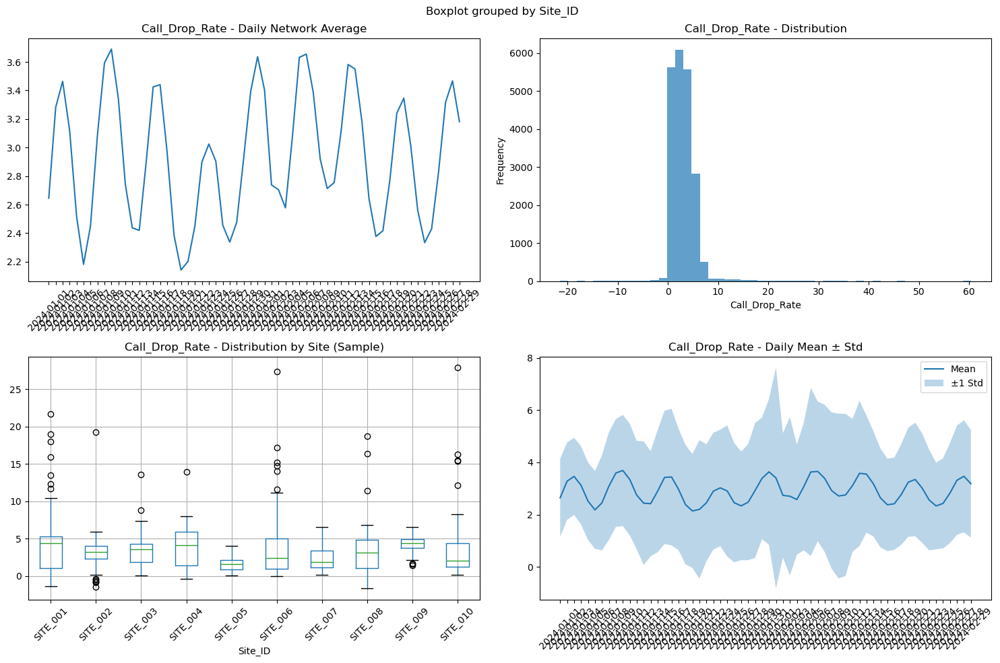

Visualizing distribution for RTT (shape: (21060, 13))


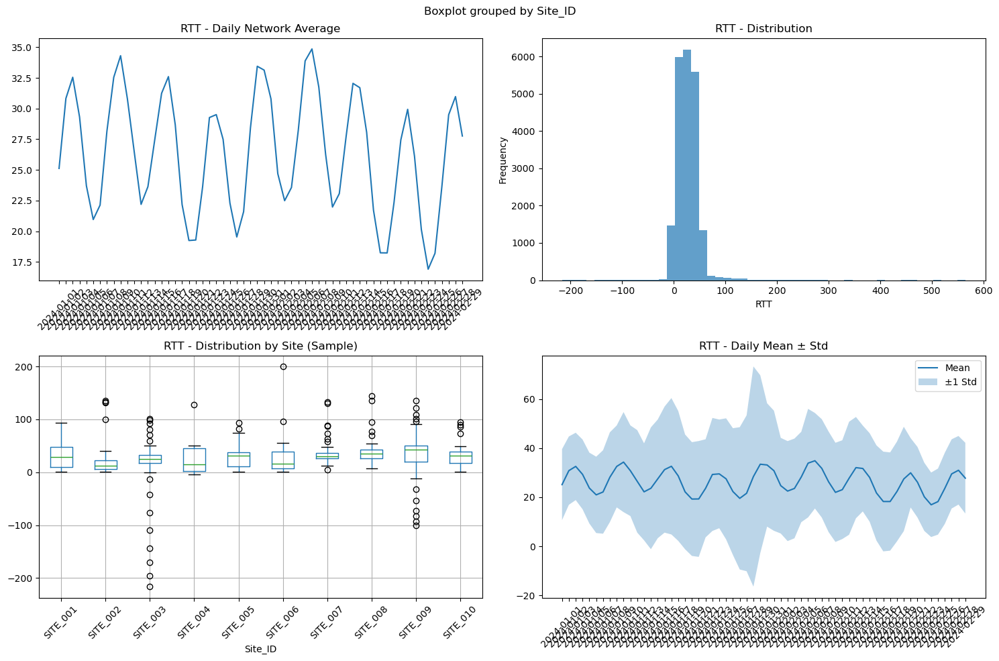

Visualizing distribution for CPU_Utilization (shape: (21060, 13))


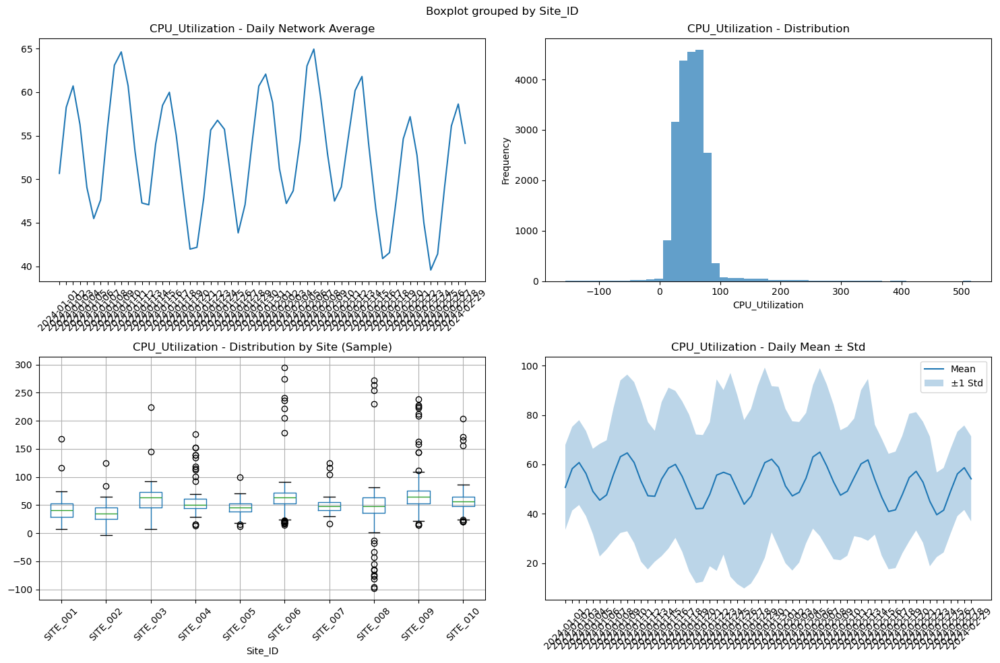

Visualizing distribution for Active_Users (shape: (21060, 13))


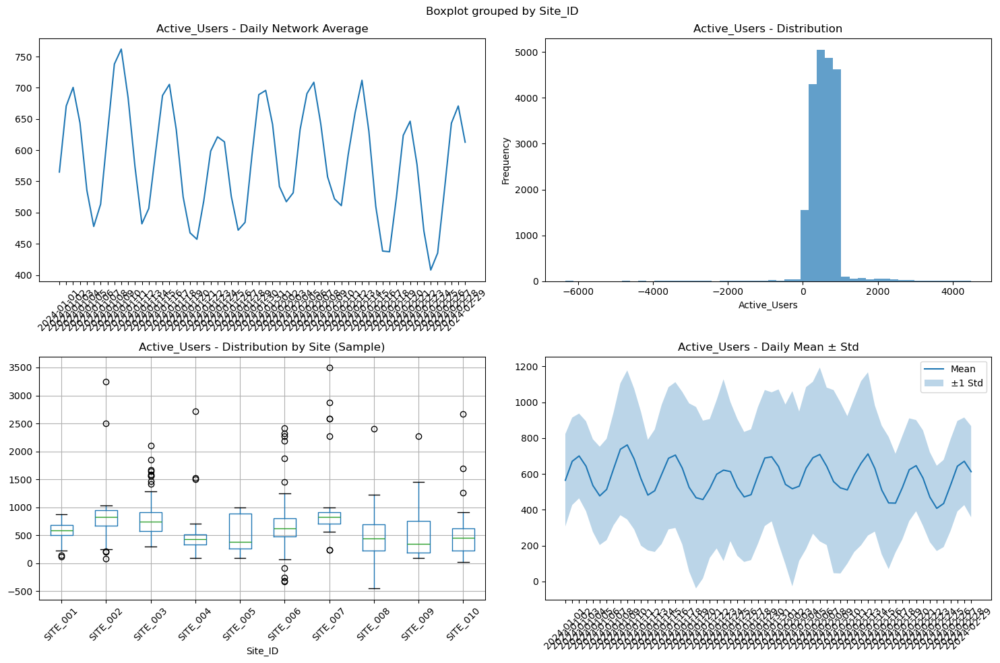

Visualizing distribution for SINR (shape: (21060, 13))


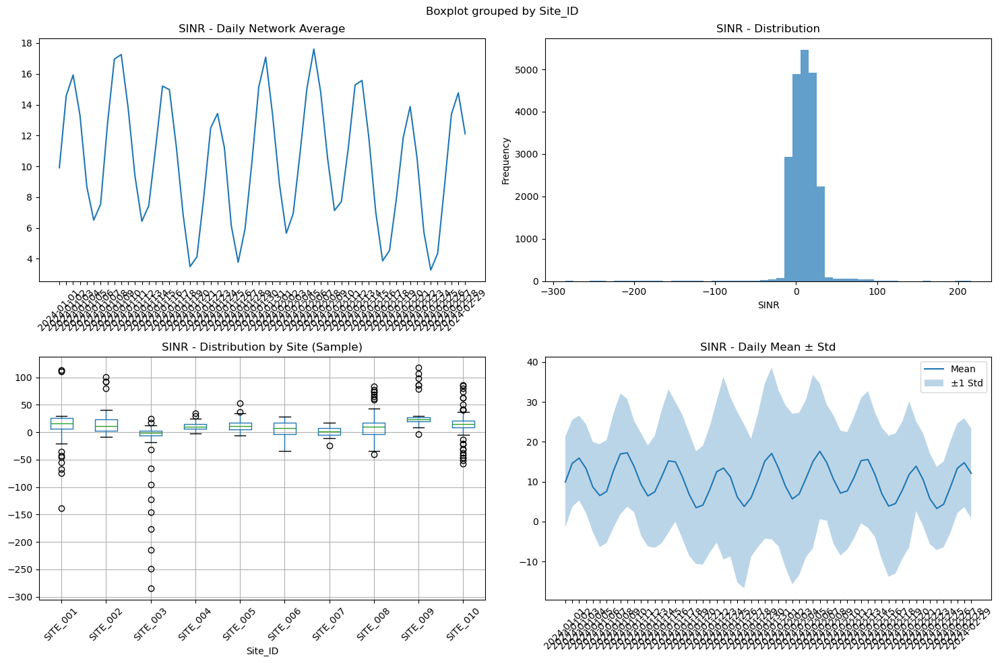

Visualizing distribution for UL_Throughput (shape: (21060, 13))


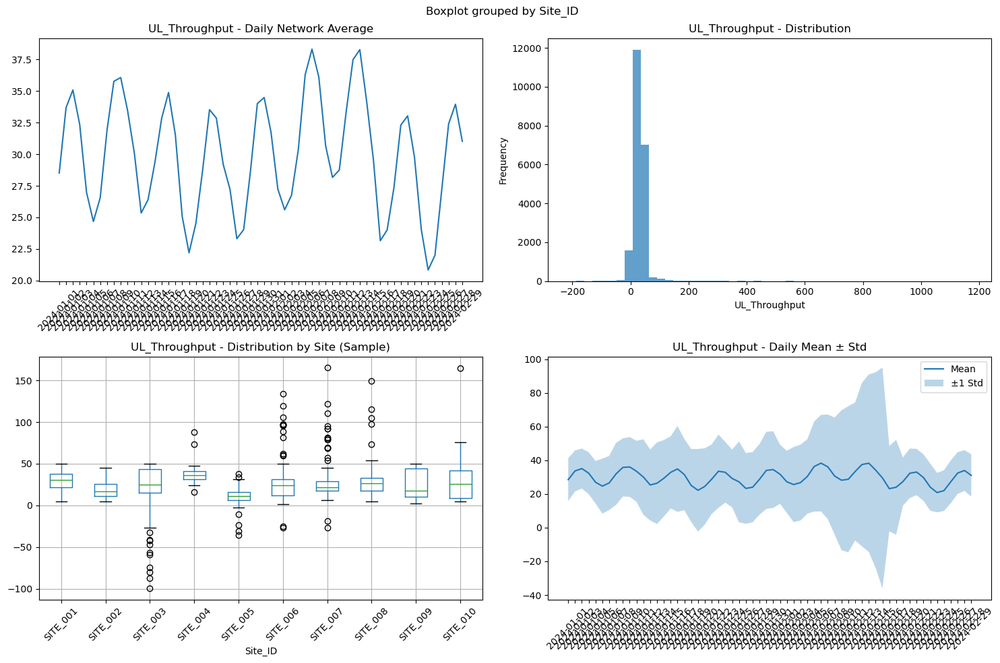

Visualizing distribution for Handover_Success_Rate (shape: (21060, 13))


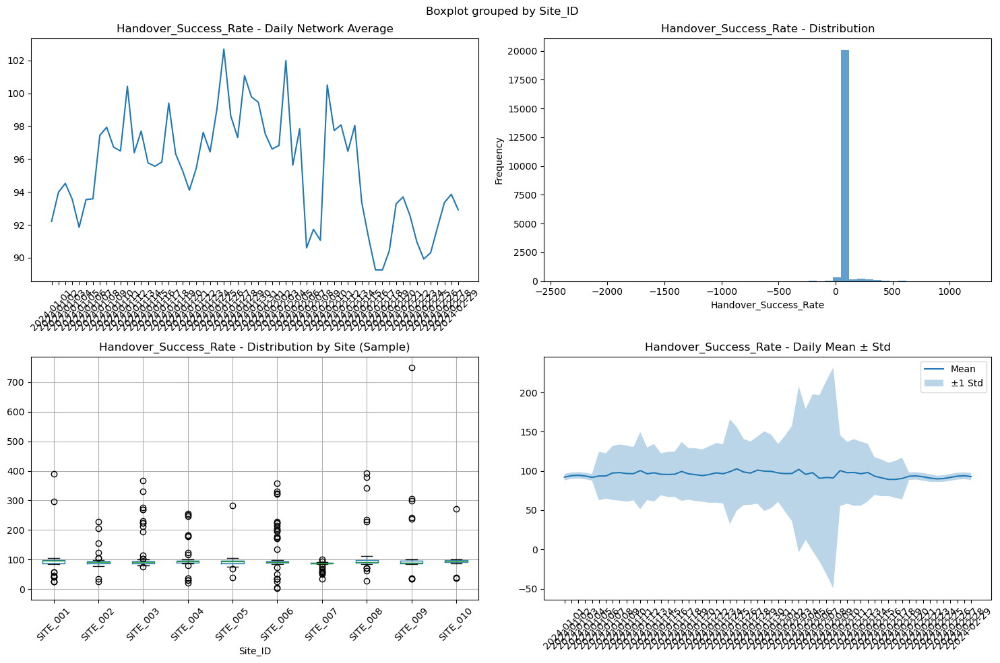

Visualizing distribution for Packet_Loss (shape: (21060, 13))


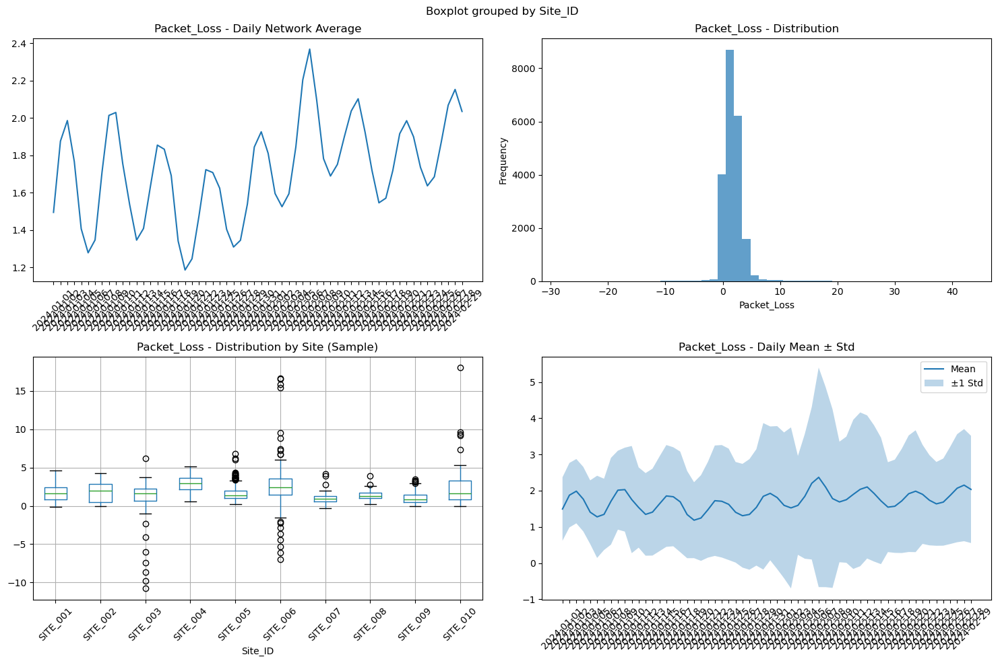

Shape after visualizations (unchanged): (21060, 13)


In [4]:
# 6. Visualize Distributions and Show Shape
kpi_columns = [col for col in df.columns if col not in ['Date', 'Site_ID', 'Sector_ID']]
for kpi in kpi_columns:
    print(f'Visualizing distribution for {kpi} (shape: {df.shape})')
    visualizer.explore_kpi_distribution(df, kpi)
print('Shape after visualizations (unchanged):', df.shape)

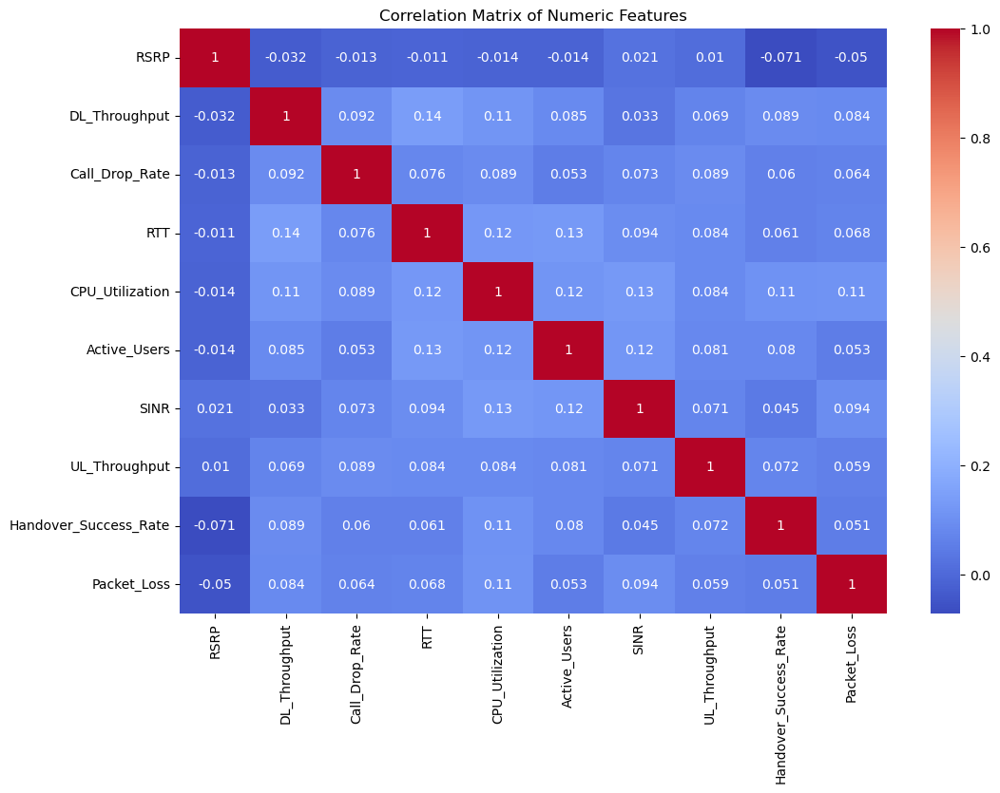

Shape after correlation analysis (unchanged): (21060, 13)


In [7]:
# 7. Correlation Analysis and Shape
import seaborn as sns
numeric_df = df.select_dtypes(include=[np.number])
plt.figure(figsize=(12,8))
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Numeric Features')
plt.show()
print('Shape after correlation analysis (unchanged):', df.shape)

In [ ]:
import pandas as pd
import numpy as np
import re
from sklearn.preprocessing import StandardScaler

# Load and parse dates
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

# Get KPI columns (numerical, excluding any that already have 'roll' or 'lag')
original_kpi_cols = [col for col in df.select_dtypes(include=[np.number]).columns 
                     if not re.search(r'roll|lag|scaled', col)]

# Rolling features (7-day)
for col in original_kpi_cols:
    df[f'{col}_roll_mean'] = df[col].rolling(window=7, min_periods=1).mean()
    df[f'{col}_roll_std'] = df[col].rolling(window=7, min_periods=1).std()
print('Rolling features added:', df.shape)

# Lag features (1 and 2 day)
for col in original_kpi_cols:
    df[f'{col}_lag1'] = df[col].shift(1)
    df[f'{col}_lag2'] = df[col].shift(2)
print('Lag features added:', df.shape)

# Scaling numeric columns
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df[numeric_cols])
scaled_df = pd.DataFrame(scaled_data, columns=[f'{col}_scaled' for col in numeric_cols], index=df.index)
df = pd.concat([df, scaled_df], axis=1)
print('Scaled features added:', df.shape)

# Save to CSV
output_path = r'C:\Users\jcati\Desktop\Chinmay\Extras\AIRA-ASSESMENT\telecom_mcp_server\data\processed_kpi_data.csv'
df.to_csv(output_path, index=False)
print(f'Final DataFrame saved to: {output_path}')

Rolling features added: (21060, 33)
Lag features added: (21060, 53)
Scaled features added: (21060, 103)
Final DataFrame saved to: C:\Users\jcati\Desktop\Chinmay\Extras\AIRA-ASSESMENT\telecom_mcp_server\data\processed_kpi_dat1.csv


In [10]:
# 9. Train/Test Split and Show Dimensions
from sklearn.model_selection import train_test_split
scaled_feature_cols = [col for col in df.columns if col.endswith('_scaled')]
X = df[scaled_feature_cols]
X_train, X_test = train_test_split(X, test_size=0.2, random_state=42)
print('Training set shape:', X_train.shape)
print('Test set shape:', X_test.shape)

Training set shape: (16848, 50)
Test set shape: (4212, 50)


Available Site-Sector combinations:
      Site_ID          Sector_ID  count
0    SITE_001  SITE_001_SECTOR_A     60
231  SITE_067  SITE_067_SECTOR_A     60
239  SITE_070  SITE_070_SECTOR_A     60
238  SITE_069  SITE_069_SECTOR_B     60
237  SITE_069  SITE_069_SECTOR_A     60
236  SITE_068  SITE_068_SECTOR_B     60
235  SITE_068  SITE_068_SECTOR_A     60
234  SITE_067  SITE_067_SECTOR_D     60
233  SITE_067  SITE_067_SECTOR_C     60
232  SITE_067  SITE_067_SECTOR_B     60
KPI Data Summary:
RSRP: 21060/21060 (100.0% valid)
DL_Throughput: 21060/21060 (100.0% valid)
Call_Drop_Rate: 21060/21060 (100.0% valid)
RTT: 21060/21060 (100.0% valid)
CPU_Utilization: 21060/21060 (100.0% valid)
Active_Users: 21060/21060 (100.0% valid)
SINR: 21060/21060 (100.0% valid)
UL_Throughput: 21060/21060 (100.0% valid)
Handover_Success_Rate: 21060/21060 (100.0% valid)
Packet_Loss: 21060/21060 (100.0% valid)
RSRP_roll_mean: 21060/21060 (100.0% valid)
RSRP_roll_std: 21059/21060 (100.0% valid)
DL_Throughput_roll_me

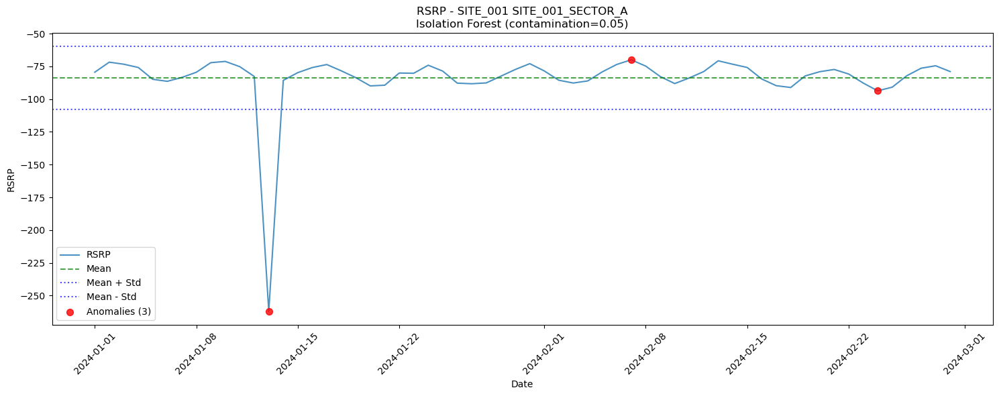

Shape after single site anomaly plot: (21060, 103)
Plotting aggregated anomalies for RSRP (shape: (21060, 103))


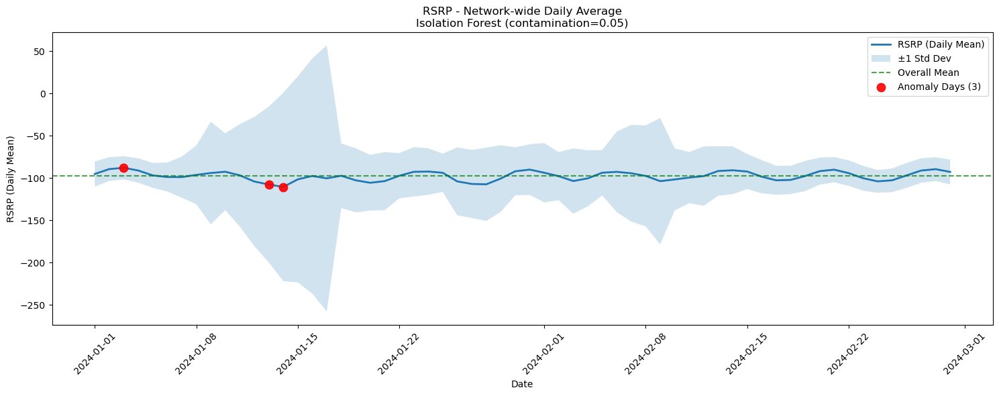

Shape after aggregated anomaly plot: (21060, 103)
Plotting multiple sites anomalies for RSRP (shape: (21060, 103))


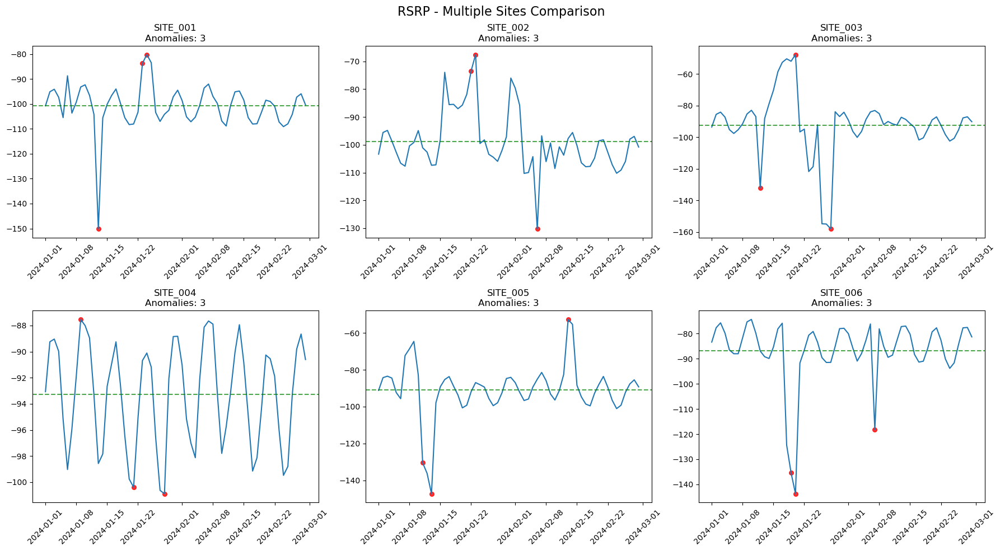

Shape after multiple sites anomaly plot: (21060, 103)
Plotting anomaly heatmap for RSRP (shape: (21060, 103))


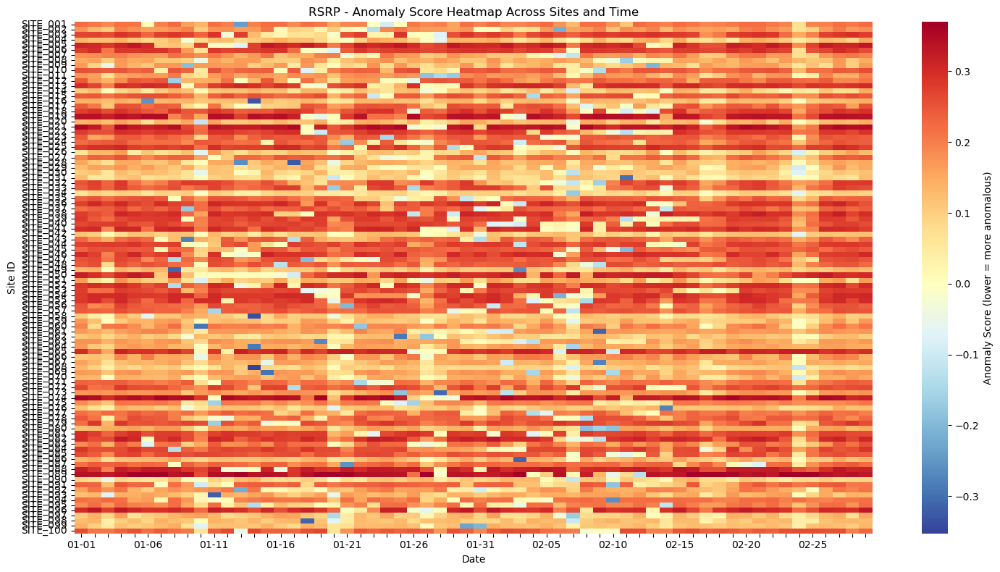

Shape after anomaly heatmap plot: (21060, 103)


In [11]:
# 10. Example Visualizations Using Visualizer Functions
site_info = visualizer.get_available_sites(df)
kpi_list = visualizer.get_kpi_summary(df)
top_site = site_info.iloc[0]['Site_ID']
top_sector = site_info.iloc[0]['Sector_ID']
print(f'Plotting single site anomalies for {top_site}, {top_sector} (shape: {df.shape})')
visualizer.plot_single_site_anomalies(df, top_site, top_sector, kpi_list[0], contamination=0.05)
print('Shape after single site anomaly plot:', df.shape)
print(f'Plotting aggregated anomalies for {kpi_list[0]} (shape: {df.shape})')
visualizer.plot_aggregated_anomalies(df, kpi_list[0], contamination=0.05)
print('Shape after aggregated anomaly plot:', df.shape)
print(f'Plotting multiple sites anomalies for {kpi_list[0]} (shape: {df.shape})')
visualizer.plot_multiple_sites_anomalies(df, kpi_list[0], contamination=0.05, max_sites=6)
print('Shape after multiple sites anomaly plot:', df.shape)
print(f'Plotting anomaly heatmap for {kpi_list[0]} (shape: {df.shape})')
visualizer.plot_anomaly_heatmap(df, kpi_list[0], contamination=0.05)
print('Shape after anomaly heatmap plot:', df.shape)

# 11. Data Dimensions After Each Visualization
After each visualization above, the shape of the DataFrame is printed to ensure transparency in preprocessing and plotting steps.
This completes the stepwise EDA with enhanced preprocessing and consistent visualizations using the custom visualizer file.

Using device: cuda
NaN count before imputation: 40
Inf count before imputation: 0
NaN count after imputation: 0
Epoch 1/30, Loss: 0.780649
Epoch 5/30, Loss: 0.344223
Epoch 10/30, Loss: 0.286035
Epoch 15/30, Loss: 0.278471
Epoch 20/30, Loss: 0.272753
Epoch 25/30, Loss: 0.265717
Epoch 30/30, Loss: 0.260597
Autoencoder training complete.


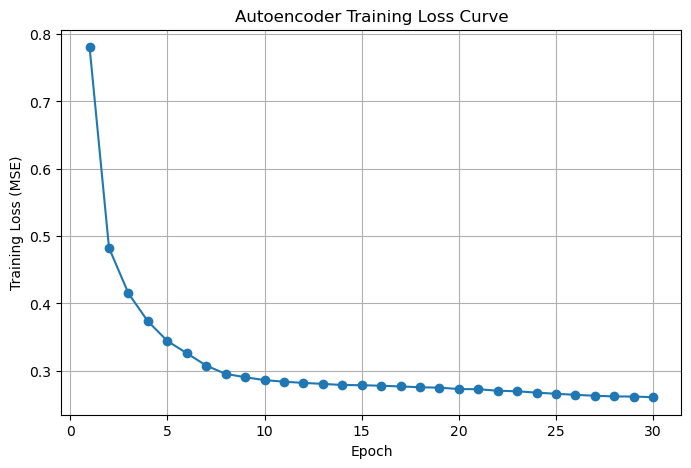

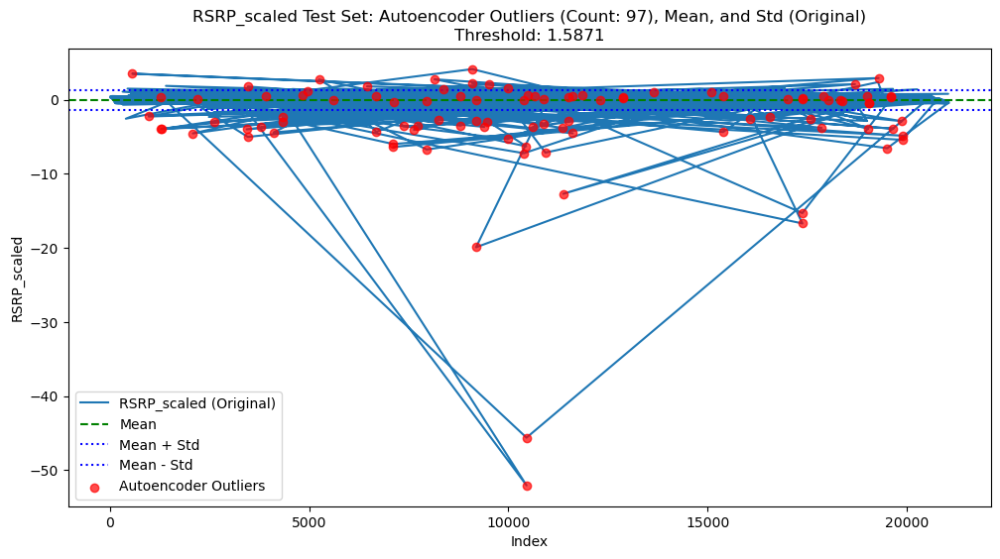

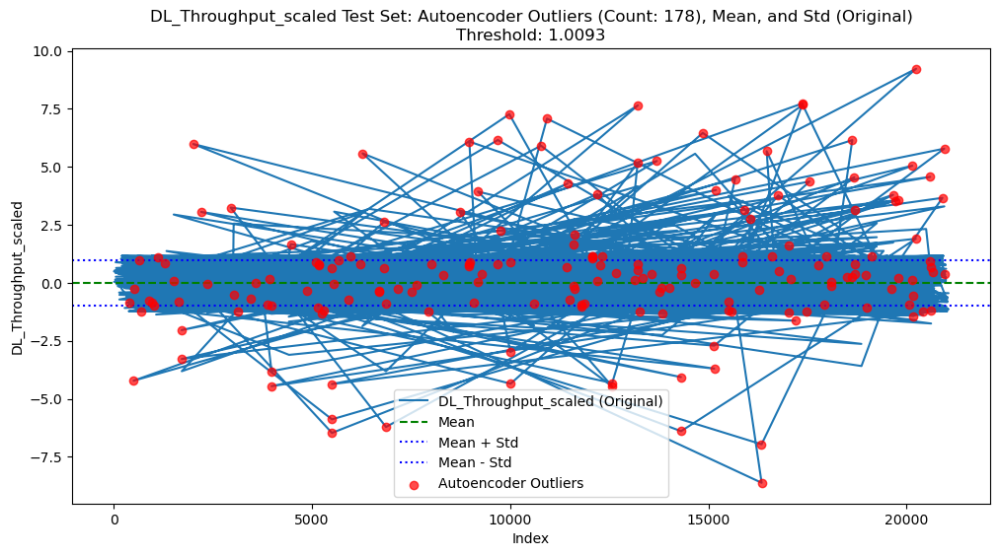

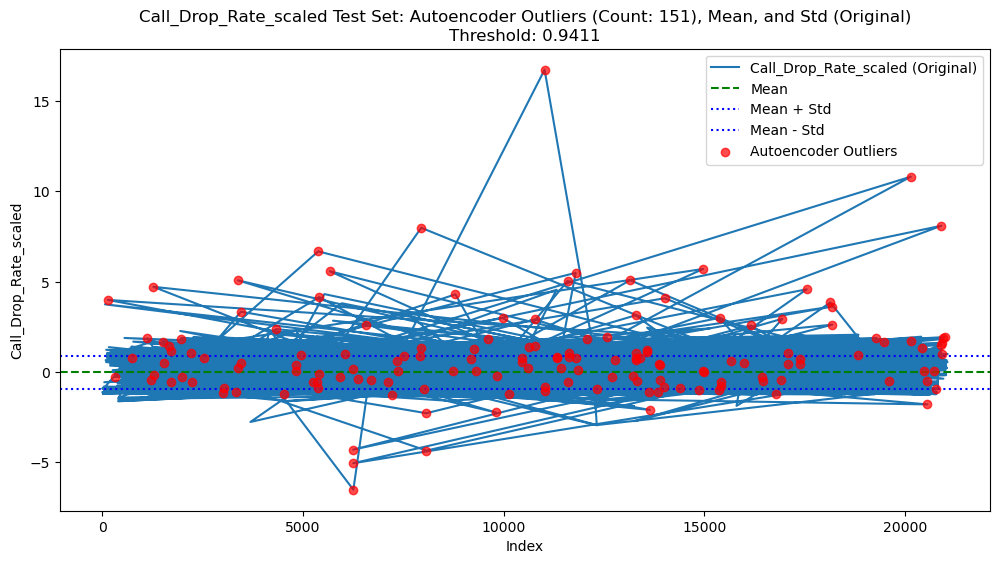

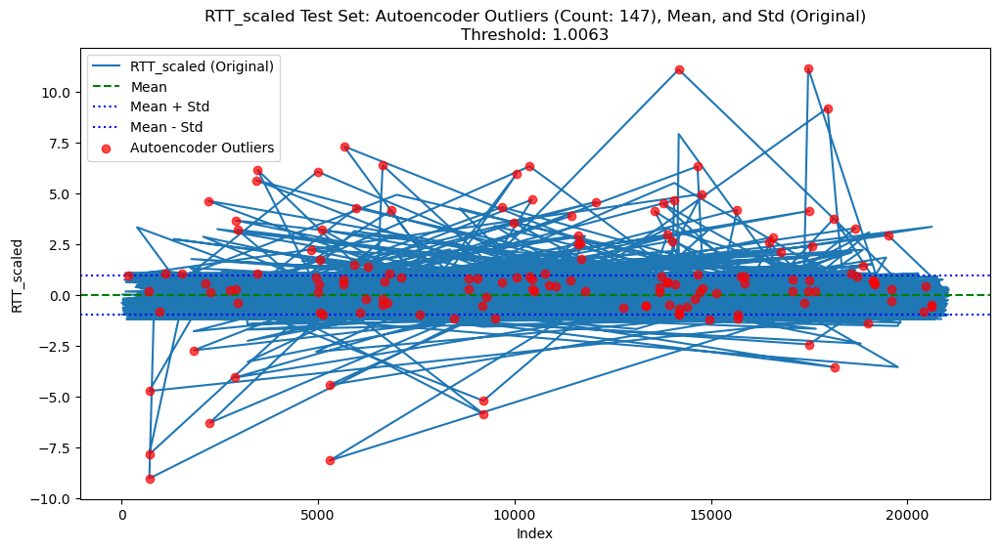

...

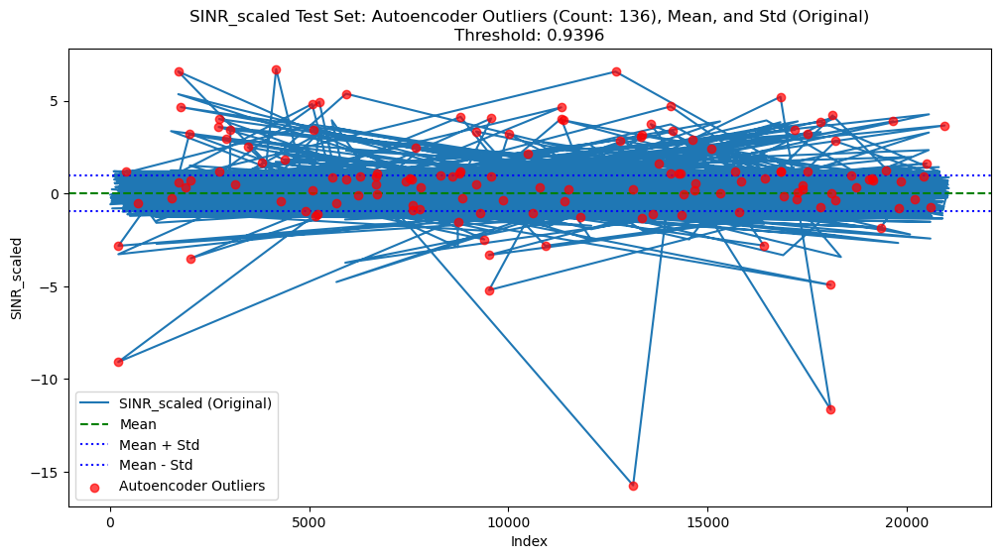

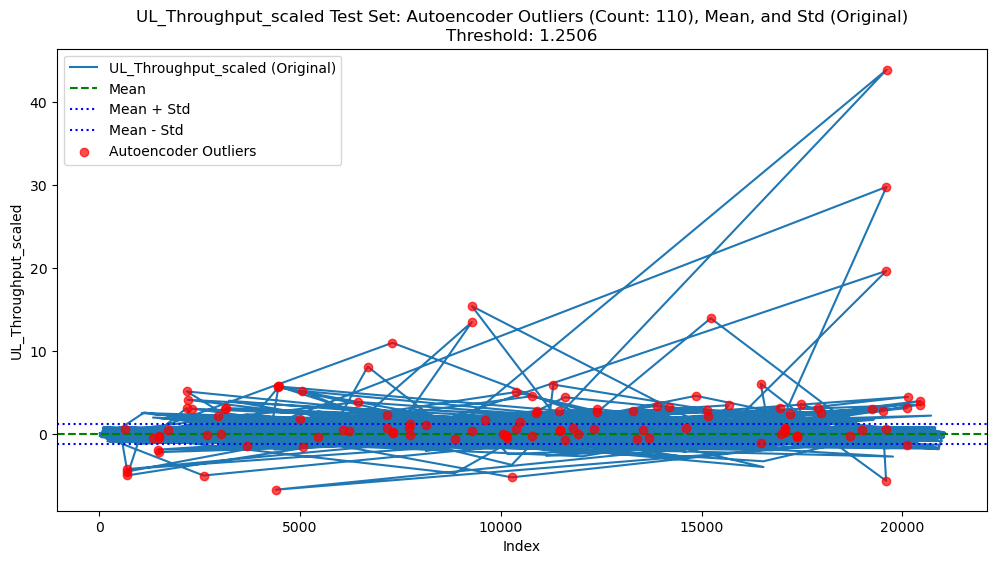

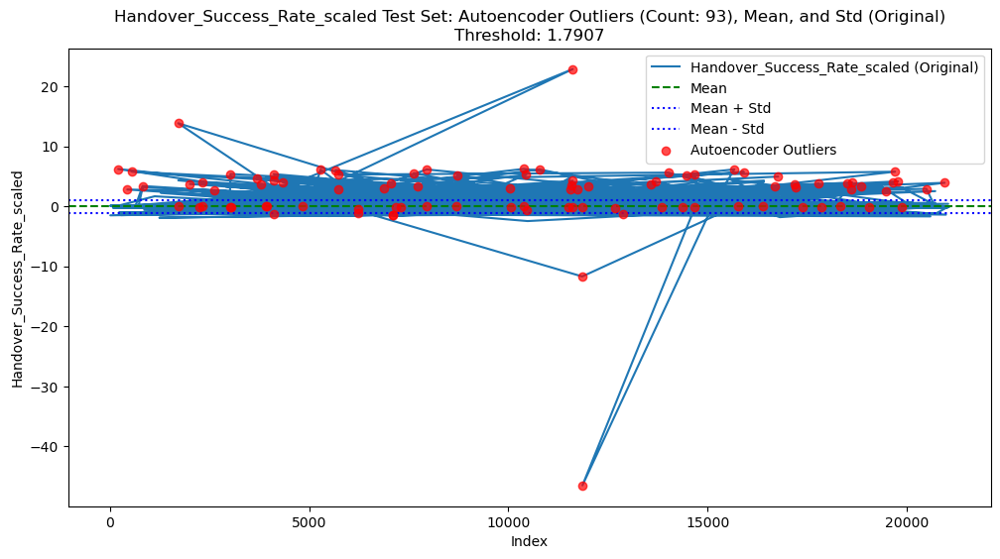

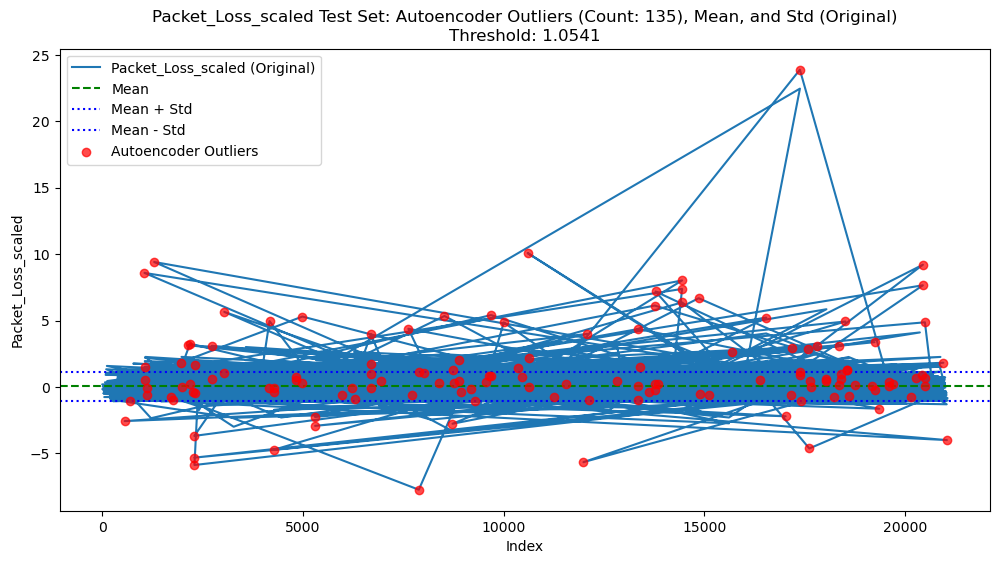

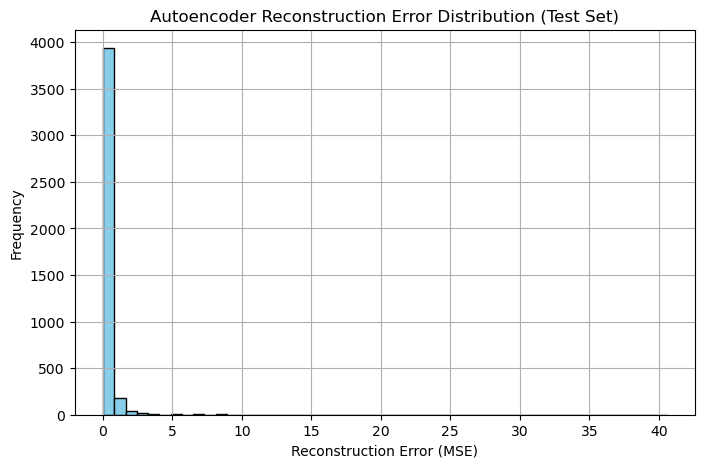

Available Site-Sector combinations:
      Site_ID          Sector_ID  count
0    SITE_001  SITE_001_SECTOR_A     60
231  SITE_067  SITE_067_SECTOR_A     60
239  SITE_070  SITE_070_SECTOR_A     60
238  SITE_069  SITE_069_SECTOR_B     60
237  SITE_069  SITE_069_SECTOR_A     60
236  SITE_068  SITE_068_SECTOR_B     60
235  SITE_068  SITE_068_SECTOR_A     60
234  SITE_067  SITE_067_SECTOR_D     60
233  SITE_067  SITE_067_SECTOR_C     60
232  SITE_067  SITE_067_SECTOR_B     60
KPI Data Summary:
RSRP: 21060/21060 (100.0% valid)
DL_Throughput: 21060/21060 (100.0% valid)
Call_Drop_Rate: 21060/21060 (100.0% valid)
RTT: 21060/21060 (100.0% valid)
CPU_Utilization: 21060/21060 (100.0% valid)
Active_Users: 21060/21060 (100.0% valid)
SINR: 21060/21060 (100.0% valid)
UL_Throughput: 21060/21060 (100.0% valid)
Handover_Success_Rate: 21060/21060 (100.0% valid)
Packet_Loss: 21060/21060 (100.0% valid)
RSRP_roll_mean: 21060/21060 (100.0% valid)
RSRP_roll_std: 21059/21060 (100.0% valid)
DL_Throughput_roll_me

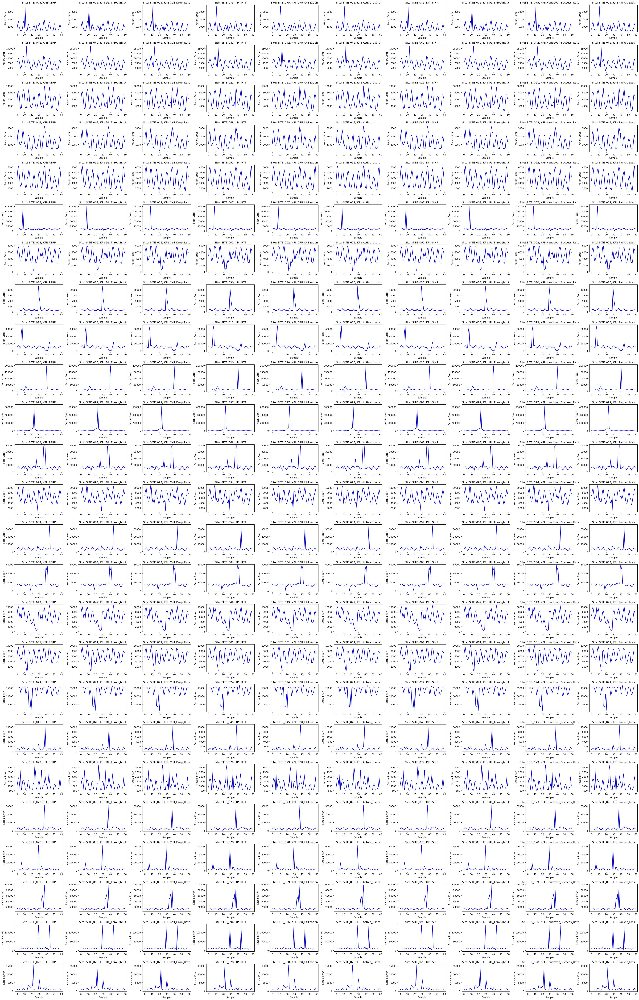

In [13]:
# 12. Train Autoencoder (with GPU support), Impute NaNs, Visualize Training Loss, and Anomaly Outputs
import torch
from torch.utils.data import DataLoader, TensorDataset
import matplotlib.pyplot as plt
from visualizer import plot_autoencoder_kpi_anomalies

# Set device to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

# Define Autoencoder class (must match training)
class Autoencoder(torch.nn.Module):
    def __init__(self, input_dim):
        super(Autoencoder, self).__init__()
        self.encoder = torch.nn.Sequential(
            torch.nn.Linear(input_dim, input_dim // 2),
            torch.nn.ReLU(),
            torch.nn.Linear(input_dim // 2, input_dim // 4),
            torch.nn.ReLU()
        )
        self.decoder = torch.nn.Sequential(
            torch.nn.Linear(input_dim // 4, input_dim // 2),
            torch.nn.ReLU(),
            torch.nn.Linear(input_dim // 2, input_dim)
        )
    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

# Check for NaN/Inf in training data
import numpy as np
print('NaN count before imputation:', np.isnan(X_train.values).sum())
print('Inf count before imputation:', np.isinf(X_train.values).sum())

# Impute NaN values with 0
X_train_imputed = X_train.fillna(0)
print('NaN count after imputation:', np.isnan(X_train_imputed.values).sum())

# Prepare train and test data
input_dim = X_train_imputed.shape[1]
model = Autoencoder(input_dim).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
criterion = torch.nn.MSELoss()

X_train_tensor = torch.tensor(X_train_imputed.values, dtype=torch.float32).to(device)
train_loader = DataLoader(TensorDataset(X_train_tensor), batch_size=64, shuffle=True)
n_epochs = 30
losses = []
for epoch in range(n_epochs):
    model.train()
    epoch_loss = 0
    for batch in train_loader:
        inputs = batch[0].to(device)
        outputs = model(inputs)
        loss = criterion(outputs, inputs)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item() * inputs.size(0)
    epoch_loss /= len(train_loader.dataset)
    losses.append(epoch_loss)
    if (epoch+1) % 5 == 0 or epoch == 0:
        print(f'Epoch {epoch+1}/{n_epochs}, Loss: {epoch_loss:.6f}')
print('Autoencoder training complete.')

# Plot training loss curve
plt.figure(figsize=(8,5))
plt.plot(range(1, n_epochs+1), losses, marker='o')
plt.xlabel('Epoch')
plt.ylabel('Training Loss (MSE)')
plt.title('Autoencoder Training Loss Curve')
plt.grid(True)
plt.show()

# Visualize outputs on test data (anomaly detection)
model.eval()
X_test_tensor = torch.tensor(X_test.values, dtype=torch.float32).to(device)
kpi_list = list(X_test.columns)[:10] if len(X_test.columns) > 10 else list(X_test.columns)
plot_autoencoder_kpi_anomalies(X_test, X_test_tensor, model, kpi_list)

# Additional: Visualize reconstruction error distribution
with torch.no_grad():
    recon = model(X_test_tensor)
    mse = torch.mean((recon - X_test_tensor)**2, dim=1).cpu().numpy()
plt.figure(figsize=(8,5))
plt.hist(mse, bins=50, color='skyblue', edgecolor='black')
plt.xlabel('Reconstruction Error (MSE)')
plt.ylabel('Frequency')
plt.title('Autoencoder Reconstruction Error Distribution (Test Set)')
plt.grid(True)
plt.show()

# Plot autoencoder reconstruction error for 25 random sites and all 10 KPIs in subplots (fix input shape)
import random
site_info = visualizer.get_available_sites(df)
kpi_list_full = visualizer.get_kpi_summary(df)[:10]
site_ids = site_info['Site_ID'].unique()
random_sites = random.sample(list(site_ids), min(25, len(site_ids)))
fig, axes = plt.subplots(len(random_sites), len(kpi_list_full), figsize=(4*len(kpi_list_full), 2.5*len(random_sites)), squeeze=False)
for i, site in enumerate(random_sites):
    sector_ids = site_info[site_info['Site_ID'] == site]['Sector_ID'].unique()
    sector = sector_ids[0] if len(sector_ids) > 0 else None
    site_mask = (df['Site_ID'] == site) & (df['Sector_ID'] == sector)
    site_df = df[site_mask]
    # For each site, use all 10 KPIs as input features (matching autoencoder input_dim)
    if site_df.shape[0] == 0:
        for j in range(len(kpi_list_full)):
            axes[i][j].set_title(f'No data for Site: {site}')
            axes[i][j].axis('off')
        continue
    site_X = site_df[kpi_list_full].fillna(0).values
    # Ensure shape (n_samples, input_dim)
    if site_X.shape[1] != input_dim:
        # Pad or trim columns to match input_dim
        if site_X.shape[1] < input_dim:
            pad_width = input_dim - site_X.shape[1]
            site_X = np.pad(site_X, ((0,0),(0,pad_width)), mode='constant')
        else:
            site_X = site_X[:,:input_dim]
    site_X_tensor = torch.tensor(site_X, dtype=torch.float32).to(device)
    with torch.no_grad():
        recon_site = model(site_X_tensor)
        mse_site = torch.mean((recon_site - site_X_tensor)**2, dim=1).cpu().numpy()
    for j, kpi in enumerate(kpi_list_full):
        ax = axes[i][j]
        try:
            ax.plot(mse_site, color='blue')
            ax.set_title(f'Site: {site}, KPI: {kpi}')
            ax.set_xlabel('Sample')
            ax.set_ylabel('Recon. Error')
        except Exception as e:
            ax.set_title(f'Error: {e}')
            ax.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
import pickle
import os

# Create models directory if it doesn't exist
os.makedirs("models", exist_ok=True)

# Save the trained autoencoder model
torch.save(model.state_dict(), "telecom_mcp_server/models/autoencoder_model.pth")
print("Saved autoencoder model to telecom_mcp_server/models/autoencoder_model.pth")

# Save the scaler (if you used one during preprocessing)
# If you used StandardScaler during preprocessing, save it:
if 'scaler' in locals() or 'scaler' in globals():
    with open("telecom_mcp_server/models/scaler.pkl", "wb") as f:
        pickle.dump(scaler, f)
    print("Saved scaler to telecom_mcp_server/models/scaler.pkl")
else:
    # If you didn't use a scaler, create a dummy one or skip
    print("No scaler found. If you used StandardScaler during preprocessing, make sure to save it.")

# Save training metadata for reference
training_metadata = {
    "input_dim": input_dim,
    "n_epochs": n_epochs,
    "final_loss": losses[-1],
    "device": str(device),
    "training_features": list(X_train_imputed.columns) if hasattr(X_train_imputed, 'columns') else f"Features: {input_dim}",
    "model_architecture": {
        "encoder": [input_dim, input_dim // 2, input_dim // 4],
        "decoder": [input_dim // 4, input_dim // 2, input_dim]
    }
}

with open("telecom_mcp_server/models/training_metadata.json", "w") as f:
    import json
    json.dump(training_metadata, f, indent=2, default=str)
print("✅ Saved training metadata to telecom_mcp_server/models/training_metadata.json")

print(f"\n📊 Training Summary:")
print(f"   Input dimension: {input_dim}")
print(f"   Final training loss: {losses[-1]:.6f}")
print(f"   Model saved with {sum(p.numel() for p in model.parameters())} parameters")

Saved scaler to telecom_mcp_server/models/scaler.pkl
✅ Saved training metadata to telecom_mcp_server/models/training_metadata.json

📊 Training Summary:
   Input dimension: 50
   Final training loss: 0.260597
   Model saved with 3212 parameters


    Site_ID          Sector_ID
0  SITE_001  SITE_001_SECTOR_A
1  SITE_001  SITE_001_SECTOR_B
2  SITE_001  SITE_001_SECTOR_C
3  SITE_001  SITE_001_SECTOR_D
4  SITE_002  SITE_002_SECTOR_A
5  SITE_002  SITE_002_SECTOR_B
6  SITE_002  SITE_002_SECTOR_C
7  SITE_002  SITE_002_SECTOR_D
8  SITE_003  SITE_003_SECTOR_A
9  SITE_003  SITE_003_SECTOR_B
Using Site_ID: SITE_001, Sector_ID: SITE_001_SECTOR_B


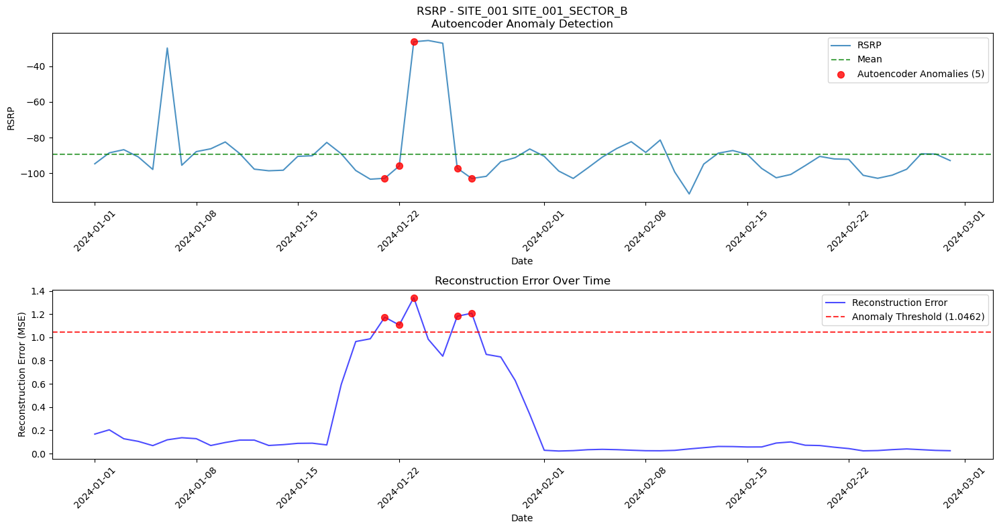

Total samples: 60
Anomalies detected: 5 (8.3%)
Reconstruction error - Mean: 0.2690, Std: 0.3886
Anomaly threshold: 1.0462


In [20]:
# List all available site/sector pairs
site_sector_pairs = df[['Site_ID', 'Sector_ID']].drop_duplicates().reset_index(drop=True)
print(site_sector_pairs.head(10))  # Show first 10 pairs for quick reference

# Example: Use the first available pair for plotting
valid_site_id = site_sector_pairs.loc[0, 'Site_ID']
valid_sector_id = site_sector_pairs.loc[1, 'Sector_ID']
print(f"Using Site_ID: {valid_site_id}, Sector_ID: {valid_sector_id}")

# Run anomaly plot for the selected site/sector
visualizer.plot_single_site_autoencoder_anomalies(df, model, valid_site_id, valid_sector_id, 'RSRP', device=device)

Available Site-Sector combinations:
      Site_ID          Sector_ID  count
0    SITE_001  SITE_001_SECTOR_A     60
231  SITE_067  SITE_067_SECTOR_A     60
239  SITE_070  SITE_070_SECTOR_A     60
238  SITE_069  SITE_069_SECTOR_B     60
237  SITE_069  SITE_069_SECTOR_A     60
236  SITE_068  SITE_068_SECTOR_B     60
235  SITE_068  SITE_068_SECTOR_A     60
234  SITE_067  SITE_067_SECTOR_D     60
233  SITE_067  SITE_067_SECTOR_C     60
232  SITE_067  SITE_067_SECTOR_B     60
KPI Data Summary:
RSRP: 21060/21060 (100.0% valid)
DL_Throughput: 21060/21060 (100.0% valid)
Call_Drop_Rate: 21060/21060 (100.0% valid)
RTT: 21060/21060 (100.0% valid)
CPU_Utilization: 21060/21060 (100.0% valid)
Active_Users: 21060/21060 (100.0% valid)
SINR: 21060/21060 (100.0% valid)
UL_Throughput: 21060/21060 (100.0% valid)
Handover_Success_Rate: 21060/21060 (100.0% valid)
Packet_Loss: 21060/21060 (100.0% valid)
RSRP_roll_mean: 21060/21060 (100.0% valid)
RSRP_roll_std: 21059/21060 (100.0% valid)
DL_Throughput_roll_me

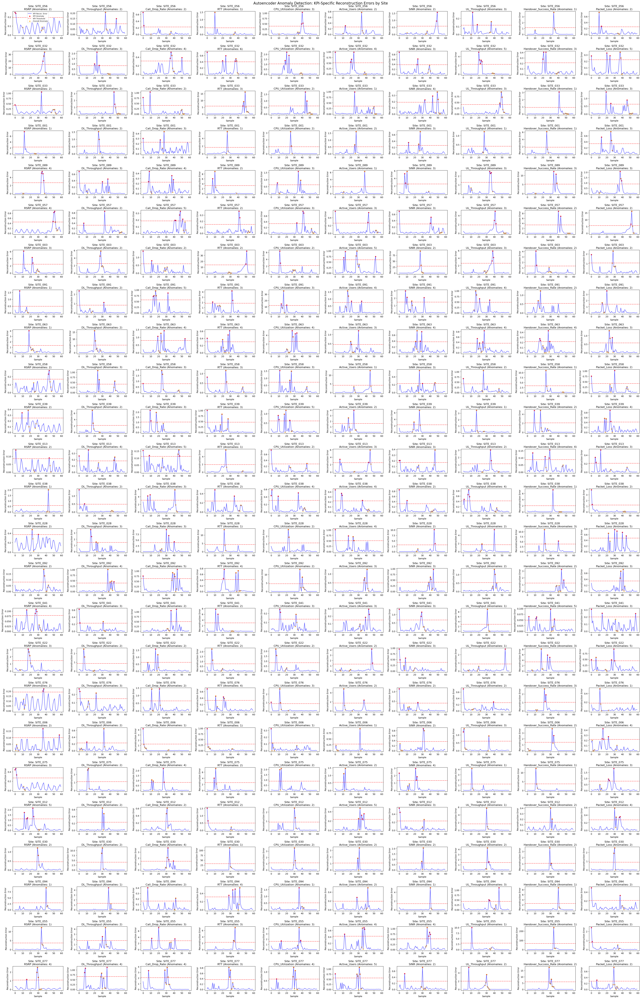

Summary:
Total sites analyzed: 25
KPIs per site: 10
Autoencoder input dimension: 50
Using pre-scaled features


In [22]:
import random
import numpy as np
import matplotlib.pyplot as plt
import torch

# Get site and KPI information
site_info = visualizer.get_available_sites(df)
kpi_list_full = visualizer.get_kpi_summary(df)[:10]
site_ids = site_info['Site_ID'].unique()
random_sites = random.sample(list(site_ids), min(25, len(site_ids)))

# Create the subplot grid
fig, axes = plt.subplots(len(random_sites), len(kpi_list_full), 
                        figsize=(4*len(kpi_list_full), 2.5*len(random_sites)), 
                        squeeze=False)

for i, site in enumerate(random_sites):
    # Get sector for this site
    sector_ids = site_info[site_info['Site_ID'] == site]['Sector_ID'].unique()
    sector = sector_ids[0] if len(sector_ids) > 0 else None
    
    # Filter data for this site
    site_mask = (df['Site_ID'] == site) & (df['Sector_ID'] == sector)
    site_df = df[site_mask].copy()
    
    # Check if we have data for this site
    if site_df.shape[0] == 0:
        for j in range(len(kpi_list_full)):
            axes[i][j].set_title(f'No data for Site: {site}')
            axes[i][j].axis('off')
        continue
    
    # Prepare input data - use the same scaled features as training
    scaled_feature_cols = [col for col in df.columns if col.endswith('_scaled')]
    
    if scaled_feature_cols:
        # Use pre-scaled features
        site_X = site_df[scaled_feature_cols].fillna(0).values
    else:
        # Scale the KPI features if no pre-scaled columns exist
        site_X = site_df[kpi_list_full].fillna(0).values
        # You should use the same scaler used during training here
        # For now, we'll assume the data is already properly scaled
    
    # Ensure correct input dimensions for the autoencoder
    if site_X.shape[1] != input_dim:
        if site_X.shape[1] < input_dim:
            pad_width = input_dim - site_X.shape[1]
            site_X = np.pad(site_X, ((0,0),(0,pad_width)), mode='constant')
        else:
            site_X = site_X[:,:input_dim]
    
    # Get autoencoder reconstruction
    site_X_tensor = torch.tensor(site_X, dtype=torch.float32).to(device)
    with torch.no_grad():
        recon_site = model(site_X_tensor)
        
        # Calculate per-feature reconstruction errors
        feature_errors = (recon_site - site_X_tensor)**2
        
        # Overall reconstruction error per sample
        overall_mse = torch.mean(feature_errors, dim=1).cpu().numpy()
    
    # Calculate overall anomaly threshold
    overall_threshold = overall_mse.mean() + 2 * overall_mse.std()
    overall_anomaly_mask = overall_mse > overall_threshold
    
    # Plot each KPI
    for j, kpi in enumerate(kpi_list_full):
        ax = axes[i][j]
        
        try:
            # Get the original KPI values for this site
            kpi_values = site_df[kpi].fillna(0).values
            
            if len(kpi_values) == 0:
                ax.set_title(f'No {kpi} data')
                ax.axis('off')
                continue
            
            # If we have scaled features, get the KPI-specific reconstruction error
            if j < feature_errors.shape[1]:
                kpi_recon_error = feature_errors[:, j].cpu().numpy()
                kpi_threshold = kpi_recon_error.mean() + 2 * kpi_recon_error.std()
                kpi_anomaly_mask = kpi_recon_error > kpi_threshold
                
                # Plot KPI-specific reconstruction error
                ax.plot(kpi_recon_error, color='blue', alpha=0.7, label='KPI Recon. Error')
                ax.scatter(np.where(kpi_anomaly_mask)[0], kpi_recon_error[kpi_anomaly_mask], 
                          color='red', s=20, alpha=0.8, label='KPI Anomaly')
                ax.axhline(kpi_threshold, color='red', linestyle='--', alpha=0.7, 
                          label='KPI Threshold')
                
                # Also show points that are overall anomalies
                ax.scatter(np.where(overall_anomaly_mask)[0], kpi_recon_error[overall_anomaly_mask], 
                          color='orange', s=15, alpha=0.6, marker='s', label='Overall Anomaly')
                
                ax.set_ylabel('Reconstruction Error')
                anomaly_count = kpi_anomaly_mask.sum()
                overall_count = overall_anomaly_mask.sum()
                
            else:
                # Fallback: show original KPI values with overall anomalies highlighted
                ax.plot(kpi_values, color='blue', alpha=0.7, label=kpi)
                if len(overall_anomaly_mask) == len(kpi_values):
                    ax.scatter(np.where(overall_anomaly_mask)[0], kpi_values[overall_anomaly_mask], 
                              color='red', s=20, alpha=0.8, label='Overall Anomaly')
                ax.set_ylabel(kpi)
                anomaly_count = overall_anomaly_mask.sum()
                overall_count = overall_anomaly_mask.sum()
            
            ax.set_title(f'Site: {site}\n{kpi} (Anomalies: {anomaly_count})')
            ax.set_xlabel('Sample')
            
            # Only show legend for first subplot to avoid clutter
            if i == 0 and j == 0:
                ax.legend(fontsize=8)
                
        except Exception as e:
            ax.set_title(f'Error: {str(e)[:30]}...')
            ax.axis('off')

plt.suptitle('Autoencoder Anomaly Detection: KPI-Specific Reconstruction Errors by Site', 
             fontsize=16, y=0.995)
plt.tight_layout()
plt.show()

# Print summary statistics
print("Summary:")
print(f"Total sites analyzed: {len(random_sites)}")
print(f"KPIs per site: {len(kpi_list_full)}")
print(f"Autoencoder input dimension: {input_dim}")
print(f"Using {'pre-scaled' if scaled_feature_cols else 'original'} features")

#torch.save(model.state_dict(), "telecom_mcp_server/models/autoencoder_model.pth")